# 0.0. Imports

In [1]:
#Import Libraries
import pandas as pd
import numpy as np

import folium
from folium.plugins import MarkerCluster

import plotly.express as px

import inflection

# 0.1. Variables Guide

In [2]:
#Adjusting variables
COUNTRIES = {
    1: "India",
    14: "Australia",
    30: "Brazil",
    37: "Canada",
    94: "Indonesia",
    148: "New Zeland",
    162: "Philippines",
    166: "Qatar",
    184: "Singapure",
    189: "South Africa",
    191: "Sri Lanka",
    208: "Turkey",
    214: "United Arab Emirates",
    215: "England",
    216: "United States of America",
}


COLORS = {
    "3F7E00": "darkgreen",
    "5BA829": "green",
    "9ACD32": "lightgreen",
    "CDD614": "orange",
    "FFBA00": "red",
    "CBCBC8": "darkred",
    "FF7800": "darkred",
}

# 0.2. Functions

In [3]:
#Functions
#Adjusting float fata format
pd.set_option('display.float_format', '{:.2f}'.format)
np.set_printoptions(suppress=True)

In [4]:
#Show dataframe dimensions
def df_dimensions(df):
    print('Number of Rows: {}'.format(df.shape[0]))
    print('Number of Columns: {}'.format(df.shape[1]))
    
    return None

In [5]:
#Get numerical attributes
def get_num(df):
    return df.select_dtypes(include=['int64', 'float64'])

In [6]:
#Show first order statistics
def get_stats(df):
    # Central Tendency Metrics
    mean = pd.DataFrame(df.apply(np.mean)).T
    median = pd.DataFrame(df.apply(np.median)).T

    # Dispersion Metrics
    min_ = pd.DataFrame(df.apply(min)).T
    max_ = pd.DataFrame(df.apply(max)).T
    range_ = pd.DataFrame(df.apply(lambda x: x.max() - x.min())).T
    std = pd.DataFrame(df.apply(np.std)).T
    skew = pd.DataFrame(df.apply(lambda x: x.skew())).T
    kurtosis = pd.DataFrame(df.apply(lambda x: x.kurtosis())).T

    # Metrics Concatenation
    m = pd.concat([min_, max_, range_, mean, median, std, skew, kurtosis]).T.reset_index()
    m.columns = ['attributes', 'min', 'max', 'range', 'mean', 'median', 'std', 'skew', 'kurtosis']
    
    return m

In [7]:
#Rename Columns
def rename_cols(df):
    df1 = df.copy()
    
    title = lambda x: inflection.titleize(x)
    spaces = lambda x: x.replace(' ', '') 
    snakecase = lambda x: inflection.underscore(x)
    
    cols_old = list(df1.columns)
    cols_old = list(map(title, cols_old))
    cols_old = list(map(spaces, cols_old))
    
    cols_new = list(map(snakecase, cols_old))
    
    df1.columns = cols_new
    
    return df1

In [8]:
#Adjust country names
def country_name(country_id):
    return COUNTRIES[country_id]

In [9]:
#Adjust color names
def color_name(color_code):
    return COLORS[color_code]

In [10]:
#Adjust price type
def price_type(price_range):
    if price_range == 1:
        return 'Cheap'
    elif price_range == 2:
        return 'Normal'
    elif price_range == 3:
        return 'Expensive'
    else:
        return 'Gourmet'

In [11]:
#Adjust columns order
def adjust_cols_order(df):
    df1 = df.copy()

    new_cols_order = [
        'restaurant_id',
        'restaurant_name',
        'country',
        'city',
        'address',
        'locality',
        'locality_verbose',
        'longitude',
        'latitude',
        'cuisines',
        'price_type',
        'average_cost_for_two',
        'currency',
        'has_table_booking',
        'has_online_delivery',
        'is_delivering_now',
        'aggregate_rating',
        'rating_color',
        'color_name',
        'rating_text',
        'votes',
    ]
    
    return df1.loc[:, new_cols_order]

In [12]:
#Data processing
def process_data(df):
    df = df.dropna()

    df = rename_cols(df)

    df['price_type'] = df.loc[:, 'price_range'].apply(lambda x: price_type(x))

    df['country'] = df.loc[:, 'country_code'].apply(lambda x: country_name(x))

    df['color_name'] = df.loc[:, 'rating_color'].apply(lambda x: color_name(x))

    df['cuisines'] = df.loc[:, 'cuisines'].apply(lambda x: x.split(',')[0])

    df = df.drop_duplicates()

    df = adjust_cols_order(df)

    df.to_csv("base_restaurantes_tratada.csv", index=False)

    return df

# 1.0. Data Description

## 1.1. Loading Data

In [13]:
#Import data
df = pd.read_csv('base_restaurantes.csv')

## 1.2. Columns Description

# 2.0. Business Analysis

In [14]:
#Data processing
df = process_data(df)

## 2.1. Statistics

In [15]:
#Analysis of data statistics
num_data = get_num(df)
get_stats(num_data)

,attributes,min,max,range,mean,median,std,skew,kurtosis
0,restaurant_id,549.00,19040277.00,19039728.00,10749577.07,7900139.00,7037873.02,-0.14,-1.71
1,longitude,-122.70,175.31,298.01,31.45,73.76,79.03,-0.61,-0.73
2,latitude,-41.33,55.98,97.31,19.42,25.27,23.52,-1.07,0.54
3,average_cost_for_two,0.00,25000017.00,25000017.00,7520.08,250.00,302512.95,81.42,6725.36
4,has_table_booking,0.00,1.00,1.00,0.06,0.00,0.24,3.68,11.57
5,has_online_delivery,0.00,1.00,1.00,0.35,0.00,0.48,0.63,-1.61
6,is_delivering_now,0.00,1.00,1.00,0.17,0.00,0.38,1.71,0.93
7,aggregate_rating,0.00,4.90,4.90,4.13,4.20,0.66,-3.95,21.66
8,votes,0.00,41333.00,41333.00,605.36,328.00,1116.46,11.38,291.23


In [16]:
#Verifying NA
df.isna().sum()

restaurant_id           0
restaurant_name         0
country                 0
city                    0
address                 0
locality                0
locality_verbose        0
longitude               0
latitude                0
cuisines                0
price_type              0
average_cost_for_two    0
currency                0
has_table_booking       0
has_online_delivery     0
is_delivering_now       0
aggregate_rating        0
rating_color            0
color_name              0
rating_text             0
votes                   0
dtype: int64

In [17]:
#Verifying duplicates
df.duplicated().sum()

0

In [18]:
#Verifying data types
df.dtypes

restaurant_id             int64
restaurant_name          object
country                  object
city                     object
address                  object
locality                 object
locality_verbose         object
longitude               float64
latitude                float64
cuisines                 object
price_type               object
average_cost_for_two      int64
currency                 object
has_table_booking         int64
has_online_delivery       int64
is_delivering_now         int64
aggregate_rating        float64
rating_color             object
color_name               object
rating_text              object
votes                     int64
dtype: object

## 2.3. Insights for Visual Report (Streamlit)

### 1. Total de Restaurantes - Visão Geral

In [19]:
df['restaurant_id'].nunique()

6929

### 2. Total de Países - Visão Geral

In [20]:
df['country'].nunique()

15

### 3. Total de Cidades - Visão Geral

In [21]:
df['city'].nunique()

125

### 4. Total de Tipos de Culinária - Visão Geral

In [22]:
df['cuisines'].nunique()

165

### 5. Total de Avaliações - Visão Geral

In [23]:
av = df['votes'].sum()
#print('Total de Avaliações:', '{:,}'.format(av).replace(',','.'))
print(f'Total de Avaliações: {av:,}'.replace(',','.'))

Total de Avaliações: 4.194.533


### 6. Mapa com Restaurantes - Visão Geral

In [24]:
fig = folium.Figure(width=1024, height=768)

map = folium.Map(max_bounds=True, titles='World Restaurants').add_to(fig)

marker_cluster = MarkerCluster().add_to(map)

for _, line in df.iterrows():
    name = line['restaurant_name']
    price_for_two = line['average_cost_for_two']
    cuisine = line['cuisines']
    currency = line['currency']
    rating = line['aggregate_rating']
    color = f'{line["color_name"]}'
    
    html = '<p><strong>{}</strong></p>'
    html += '<p>Preço p/ dois: {},00 ({})'
    html += '<br />Tipo: {}'
    html += '<br />Nota: {}/5.0'
    html = html.format(name, price_for_two, currency, cuisine, rating)
    
    popup = folium.Popup(
        folium.Html(html, script=True),
        max_width=500,
    )
    
    folium.Marker(
        [line['latitude'], line['longitude']],
        popup = popup,
        icon = folium.Icon(color=color, icon='home', prefix='fa'),
    ).add_to(marker_cluster)
    
map

### 7. Quantidade de restaurantes por país - Visão País

In [25]:
df_aux = df.loc[:, ['restaurant_id' , 'country']].groupby('country').nunique().sort_values('restaurant_id', ascending=False).reset_index()

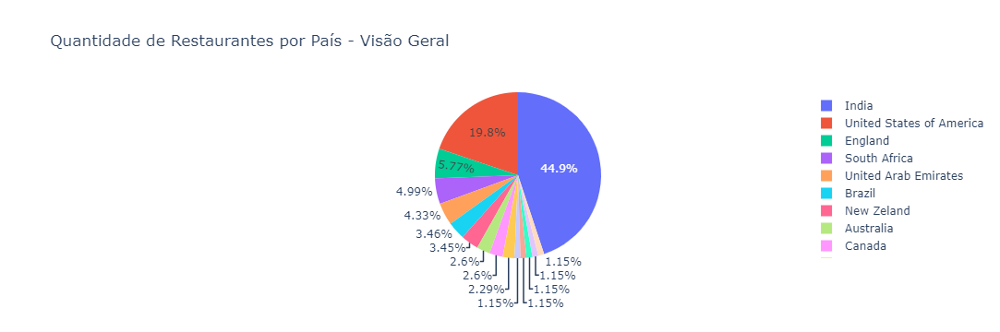

In [26]:
fig = px.pie(df_aux,
            values='restaurant_id',
            names='country',
            title='Quantidade de Restaurantes por País - Visão Geral',
            labels={'restaurant_id':'QTD Restaurantes',
                   'country':'País'})
fig.show()

### 8. Top 10 países com mais restaurantes - Visão País

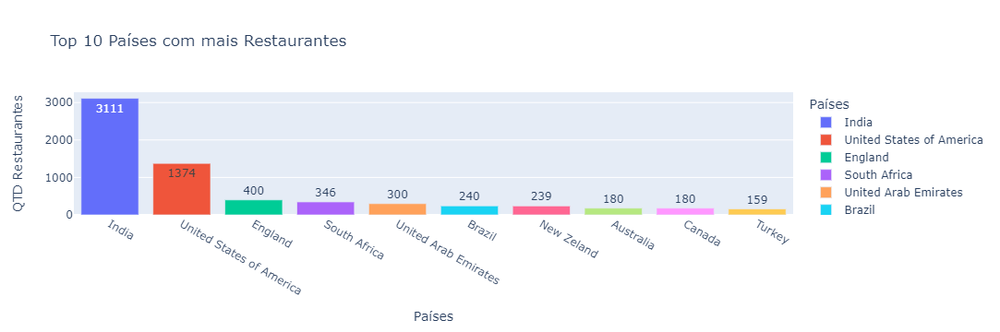

In [27]:
fig = px.bar(df_aux.head(10),
               x='country',
               y='restaurant_id',
               text='restaurant_id',
               text_auto='.0f',
               title='Top 10 Países com mais Restaurantes',
               color='country',
               labels={
                   'country':'Países',
                   'restaurant_id':'QTD Restaurantes',
               })
fig.show()

### 9. Total de tipos de culinária por país - Visão País

In [28]:
df_aux = df.loc[:, ['country', 'cuisines']].groupby('country').nunique().sort_values('cuisines', ascending=False).reset_index()

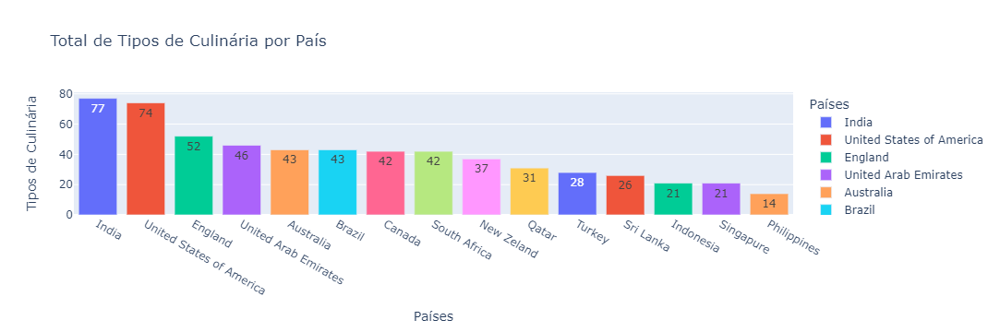

In [29]:
fig = px.bar(df_aux,
               x='country',
               y='cuisines',
               text='cuisines',
               text_auto='.0f',
               title='Total de Tipos de Culinária por País',
               color='country',
               labels={
                   'country':'Países',
                   'cuisines':'Tipos de Culinária',
               })
fig.show()

### 10. Média de Preço de um prato para duas pessoas por País - Visão País

In [30]:
cond = df['country']!='Indonesia'
df_aux = df.loc[cond, ['country', 'average_cost_for_two']].groupby('country').median().sort_values('average_cost_for_two', ascending=False).reset_index()

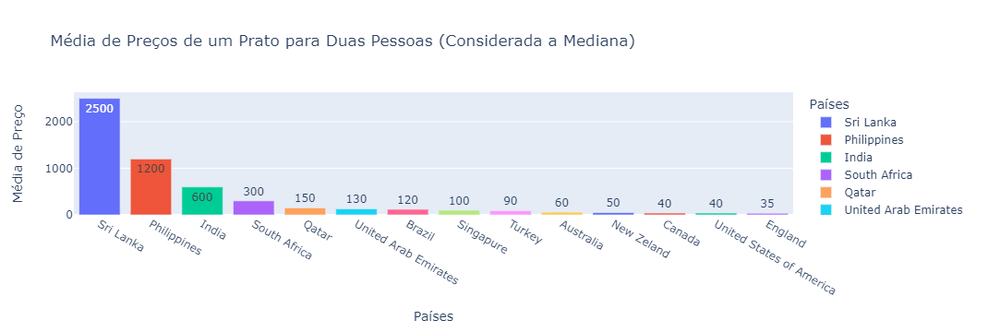

In [31]:
fig = px.bar(df_aux,
               x='country',
               y='average_cost_for_two',
               text='average_cost_for_two',
               text_auto='.0f',
               title='Média de Preços de um Prato para Duas Pessoas (Considerada a Mediana)',
               color='country',
               labels={
                   'country':'Países',
                   'average_cost_for_two':'Média de Preço',
               })
fig.show()

### 11. Média de Avaliações por País - Visão País

In [32]:
df_aux = df.loc[cond, ['country', 'votes']].groupby('country').mean().sort_values('votes', ascending=False).reset_index()

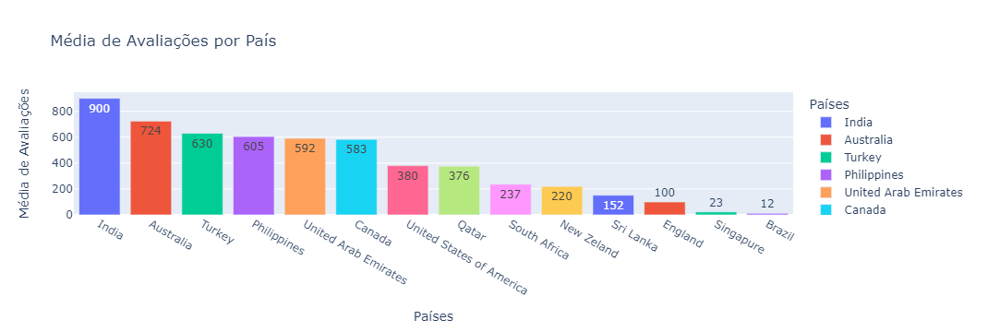

In [33]:
fig = px.bar(df_aux,
               x='country',
               y='votes',
               text='votes',
               text_auto='.0f',
               title='Média de Avaliações por País',
               color='country',
               labels={
                   'country':'Países',
                   'votes':'Média de Avaliações',
               })
fig.show()

### 12. Quantidade de restaurantes por cidade - Visão Cidades

In [34]:
df.loc[:, ['restaurant_id', 'city']].groupby('city').nunique().sort_values('restaurant_id', ascending=False).reset_index()

,city,restaurant_id
0,Abu Dhabi,80
1,Mysore,80
2,Glasgow,80
3,Goa,80
4,Guwahati,80
...,...,...
120,San Juan City,1
121,Roodepoort,1
122,Muntinlupa City,1
123,Johannesburg South,1


### 13. Top 10 cidades com mais restaurantes registrados

In [35]:
df_aux = df.loc[:, ['restaurant_id' , 'city']].groupby('city').nunique().sort_values('restaurant_id', ascending=False).reset_index()

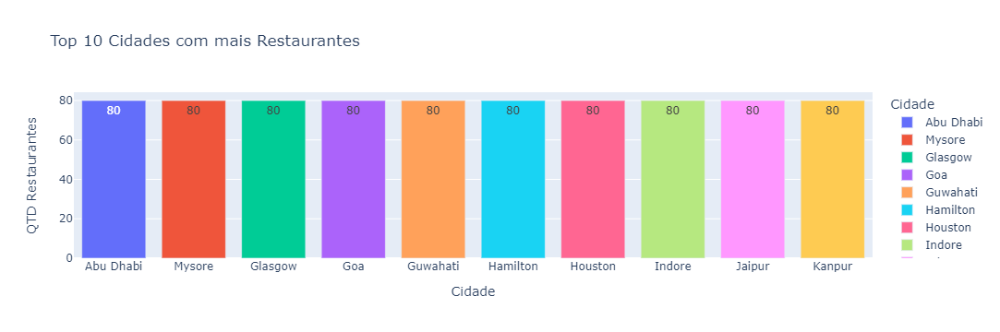

In [36]:
fig = px.bar(df_aux.head(10),
               x='city',
               y='restaurant_id',
               text='restaurant_id',
               text_auto='.0f',
               title='Top 10 Cidades com mais Restaurantes',
               color='city',
               labels={
                   'city':'Cidade',
                   'restaurant_id':'QTD Restaurantes',
               })
fig.show()

### 14. Top 10 cidades com melhores avaliações (Acima de 4.6)

In [37]:
cond = df['aggregate_rating']>4.6
df_aux = df.loc[cond, ['restaurant_id', 'city', 'aggregate_rating']].groupby('city').count().sort_values('restaurant_id', ascending=False).reset_index().head(10)

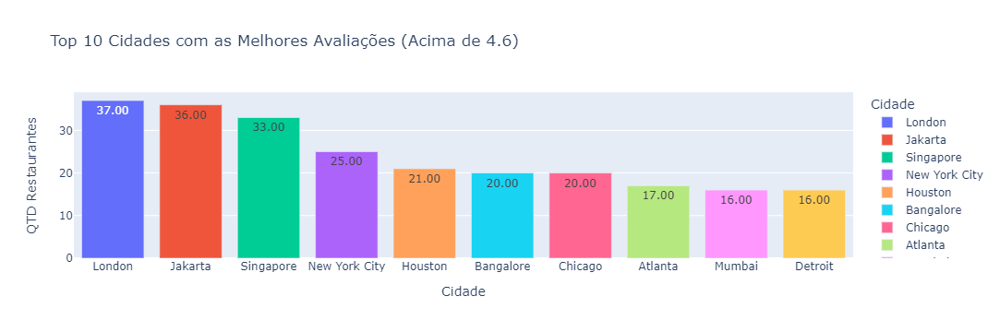

In [38]:
fig = px.bar(df_aux,
            x='city',
            y='restaurant_id',
            text='restaurant_id',
            text_auto='.2f',
            title='Top 10 Cidades com as Melhores Avaliações (Acima de 4.6)',
            color='city',
            labels={'city':'Cidade',
                   'restaurant_id':'QTD Restaurantes'})
fig.show()

### 15. Top 10 cidades com piores avaliações (Abaixo de 2.0)

In [39]:
cond = df['aggregate_rating']<2.0
df_aux = df.loc[cond, ['restaurant_id', 'city', 'aggregate_rating']].groupby('city').count().sort_values('restaurant_id', ascending=False).reset_index().head(10)

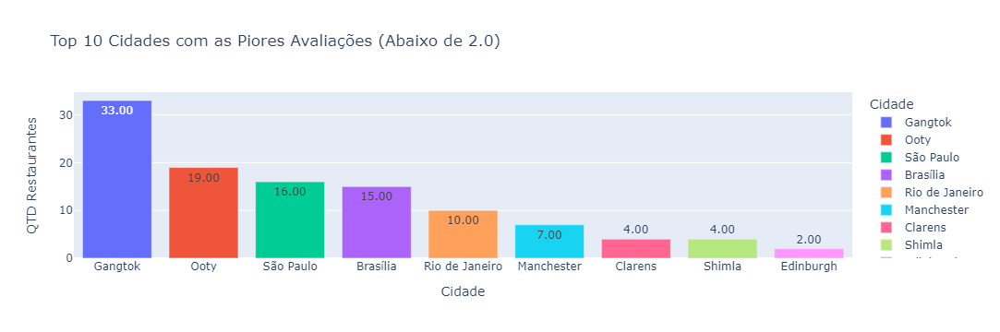

In [40]:
fig = px.bar(df_aux,
            x='city',
            y='restaurant_id',
            text='restaurant_id',
            text_auto='.2f',
            title='Top 10 Cidades com as Piores Avaliações (Abaixo de 2.0)',
            color='city',
            labels={'city':'Cidade',
                   'restaurant_id':'QTD Restaurantes'})
fig.show()

### 16. Top 10 cidades com maior variedade de tipos de culinária

In [41]:
df_aux = df.loc[:, ['cuisines', 'city']].groupby('city').nunique().sort_values('cuisines', ascending=False).reset_index().head(10)

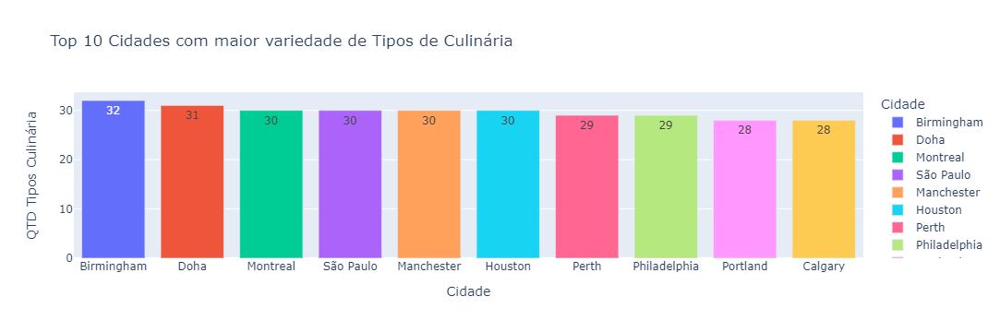

In [42]:
fig = px.bar(df_aux,
            x='city',
            y='cuisines',
            text='cuisines',
            text_auto='.0f',
            title='Top 10 Cidades com maior variedade de Tipos de Culinária',
            color='city',
            labels={'city':'Cidade',
                   'cuisines':'QTD Tipos Culinária'})
fig.show()

### 17. Top 10 tipos culinários no geral

In [43]:
df_aux = df.loc[:, ['restaurant_id', 'cuisines']].groupby('cuisines').nunique().sort_values('restaurant_id', ascending=False).reset_index().head(10)

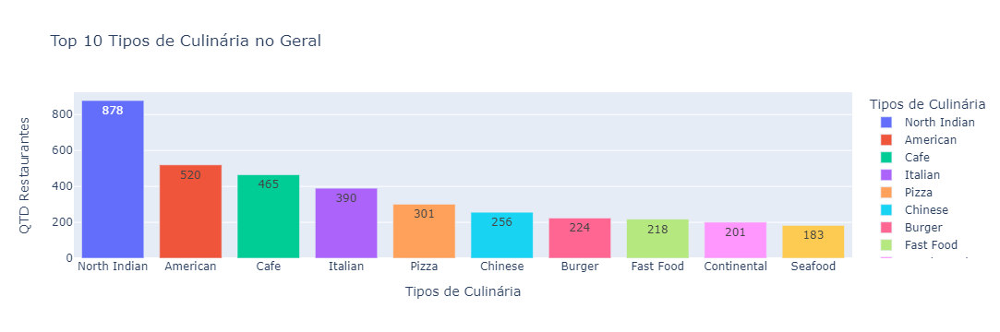

In [44]:
fig = px.bar(df_aux,
            x='cuisines',
            y='restaurant_id',
            text='restaurant_id',
            text_auto='.0f',
            title='Top 10 Tipos de Culinária no Geral',
            color='cuisines',
            labels={'cuisines':'Tipos de Culinária',
                   'restaurant_id':'QTD Restaurantes'})
fig.show()

### 18. Top 10 tipos culinários melhores avaliados

In [45]:
cond = df['aggregate_rating']>4.6
df_aux = df.loc[cond, ['restaurant_id', 'cuisines']].groupby('cuisines').nunique().sort_values('restaurant_id', ascending=False).reset_index().head(10)

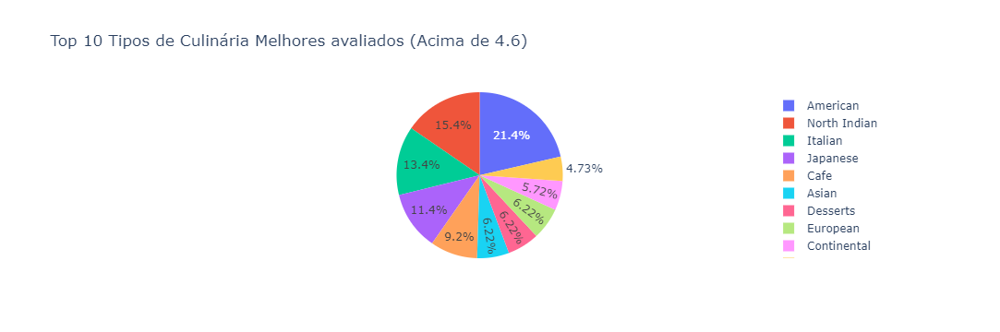

In [46]:
fig = px.pie(df_aux,
            values='restaurant_id',
            names='cuisines',
            title='Top 10 Tipos de Culinária Melhores avaliados (Acima de 4.6)',
            labels={'restaurant_id':'QTD Restaurantes',
                   'cuisines':'Tipo de Culinária'})
fig.show()

### 19. Top 10 tipos culinários piores avaliados

In [47]:
cond = df['aggregate_rating']<2.0
df_aux = df.loc[cond, ['restaurant_id', 'cuisines']].groupby('cuisines').nunique().sort_values('restaurant_id', ascending=False).reset_index().head(10)

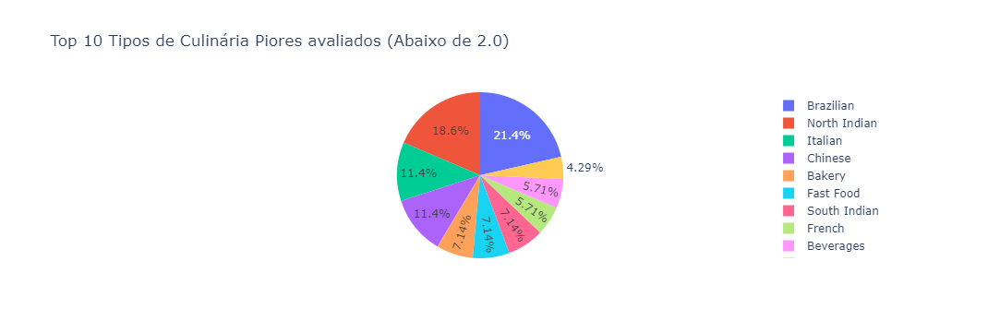

In [48]:
fig = px.pie(df_aux,
            values='restaurant_id',
            names='cuisines',
            title='Top 10 Tipos de Culinária Piores avaliados (Abaixo de 2.0)',
            labels={'restaurant_id':'QTD Restaurantes',
                   'cuisines':'Tipo de Culinária'})
fig.show()

### 20. Tipos culinários por país

In [49]:
df.loc[:, ['restaurant_id', 'country', 'cuisines']].groupby(['country', 'cuisines']).nunique().sort_values('restaurant_id', ascending=False).reset_index()

,country,cuisines,restaurant_id
0,India,North Indian,861
1,United States of America,American,358
2,India,Cafe,280
3,India,Pizza,204
4,India,Fast Food,175
...,...,...,...
592,Turkey,Finger Food,1
593,New Zeland,Creole,1
594,New Zeland,Continental,1
595,Turkey,Greek,1
